# Programming Project #1: Hybrid Images

## CS445: Computational Photography - Fall 2019

### Part I: Hybrid Images

In [2]:
import cv2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy import signal

import utils

In [3]:
%matplotlib notebook

In [4]:
im1_file = './eye.jpg'
im2_file = './earth.jpg'

im1 = cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE)

<IPython.core.display.Javascript object>


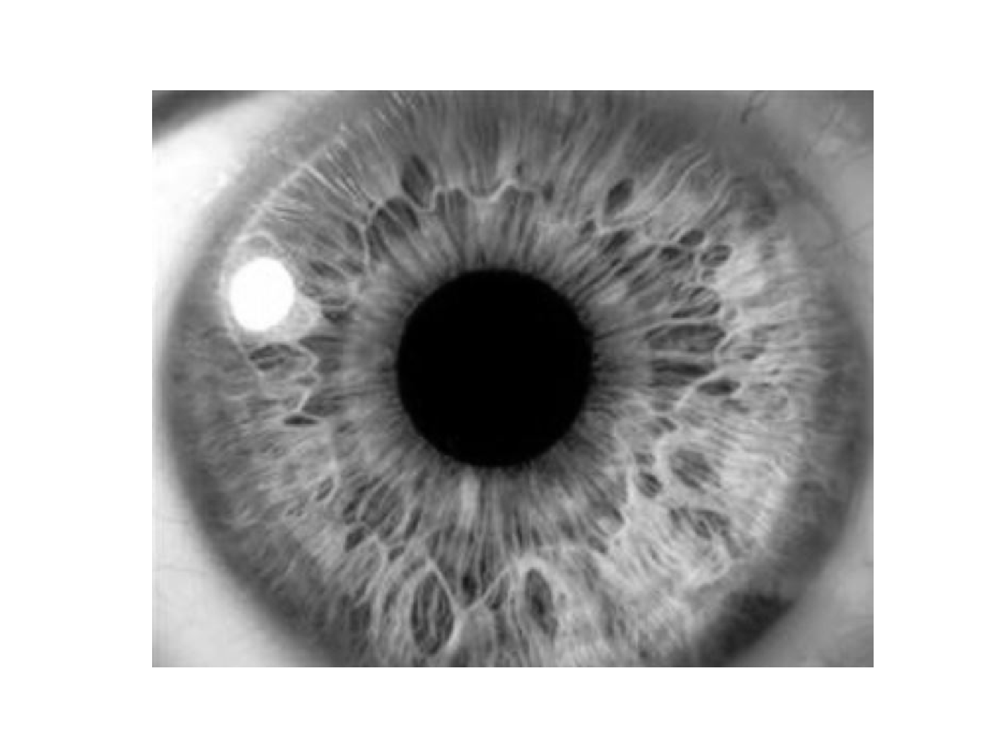

In [5]:
pts_im1 = utils.prompt_eye_selection(im1)

In [ ]:
pts_im2 = utils.prompt_eye_selection(im2)

In [22]:
im1, im2 = utils.align_images(im1_file, im2_file,pts_im1,pts_im2,save_images=False)

In [23]:
# convert to grayscale
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY) / 255.0
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY) / 255.0

<IPython.core.display.Javascript object>


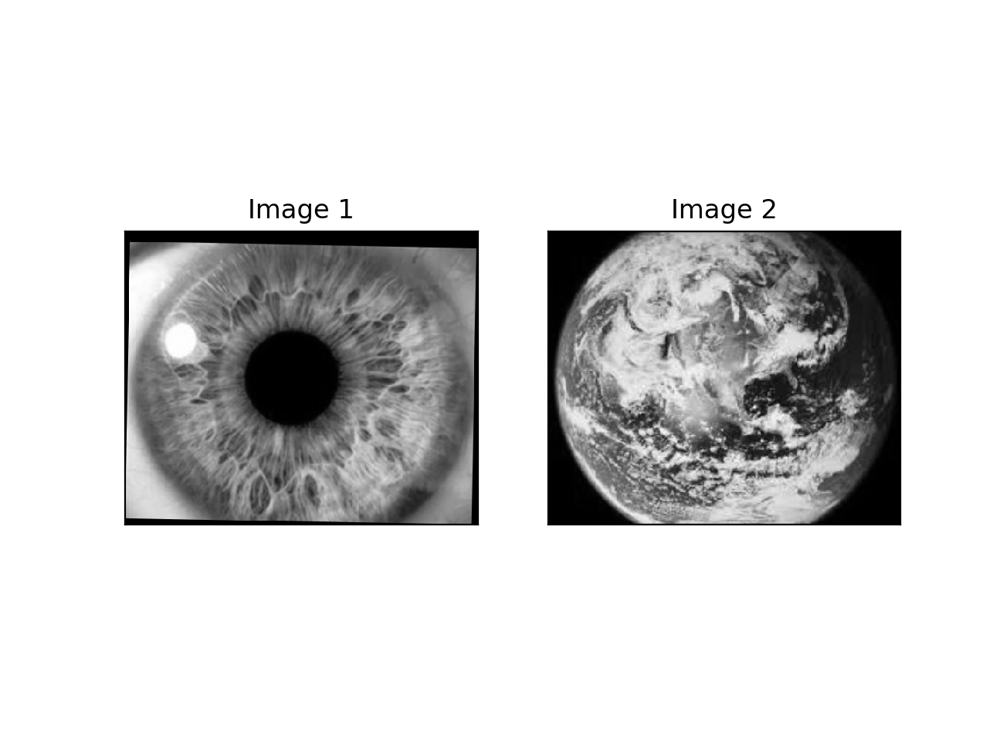

In [24]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);


In [25]:
def hybridImage(im1, im2, cutoff_low, cutoff_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
    
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''    
    gaussian_kernel = utils.gaussian_kernel(cutoff_low,3*cutoff_low )
    im2_gaussian_filtered = cv2.filter2D(im2, cv2.CV_64F, gaussian_kernel)
    im2_gaussian_filtered_normalized = im2_gaussian_filtered
#     im2_gaussian_filtered_normalized = im2_gaussian_filtered.astype(np.uint8) 
#     im2_gaussian_filtered_normalized = im2_gaussian_filtered_normalized /255

    print(im2_gaussian_filtered_normalized.min(), im2_gaussian_filtered_normalized.max())

        ##
    
    
    fig, axes = plt.subplots(1, 2)
    axes[1].imshow(im2_gaussian_filtered_normalized,cmap='gray')
    
    gaussian_kernel = utils.gaussian_kernel(cutoff_high, 3*cutoff_high)
    im1_filtered = im1 - cv2.filter2D(im1, cv2.CV_64F, gaussian_kernel)
#     im1_filtered *= 255
    im1_filtered_normalized = im1_filtered #.astype(np.uint8) 
#     im1_filtered_normalized = im1_filtered_normalized/255
    
    print(len(im2_gaussian_filtered_normalized.shape), im1_filtered_normalized.shape)        
#     if len(im2_gaussian_filtered_normalized.shape) > 2 and len(im1_filtered_normalized.shape) == 2:
#         im1_filtered_normalized = cv2.cvtColor(im1_filtered_normalized, cv2.COLOR_GRAY2BGR)
    
#     elif len(im2_gaussian_filtered_normalized.shape) == 2 and len(im1_filtered_normalized.shape) > 2:
#         im2_gaussian_filtered_normalized = cv2.cvtColor(im2_gaussian_filtered_normalized, cv2.COLOR_GRAY2BGR)
        
    axes[0].imshow(im1_filtered,cmap='gray')
    print(len(im2_gaussian_filtered_normalized.shape), im1_filtered_normalized.shape)        
    return im1_filtered_normalized, im2_gaussian_filtered_normalized


-9.614308511746407e-17 0.8164067559148931


<IPython.core.display.Javascript object>


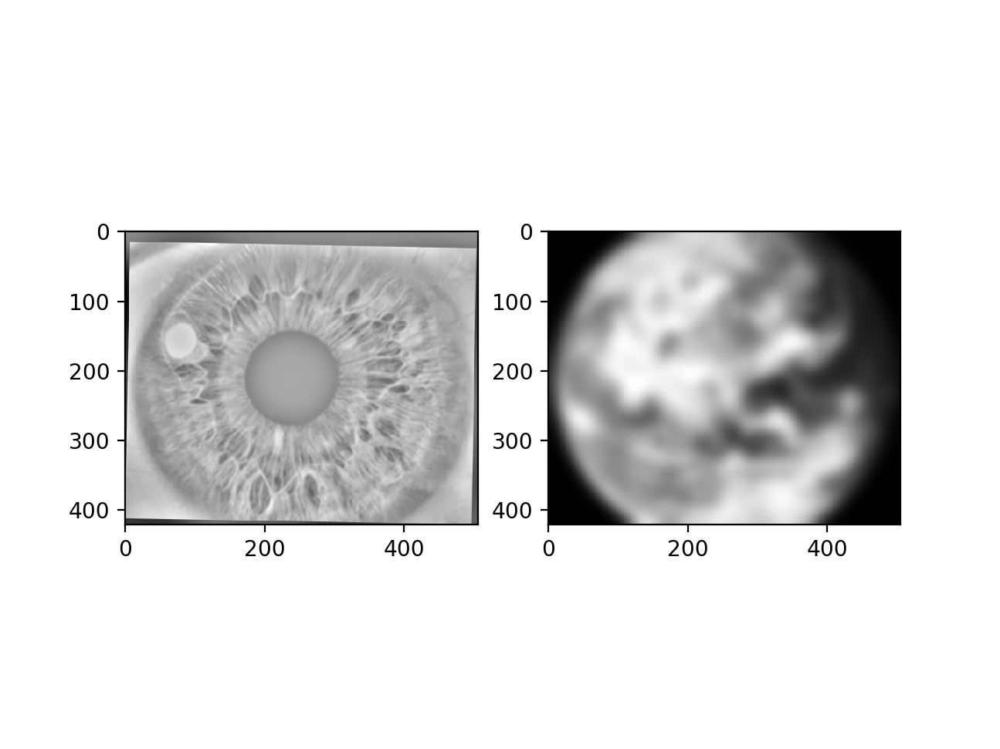

2 (421, 506)
2 (421, 506)
2 (421, 506)


In [26]:
arbitrary_value = 20  # you should choose meaningful values; you might want to set to a fraction of image size
cutoff_low = 10
cutoff_high = 20
im1_gaussian_filtered, im2_gaussian_filtered = hybridImage(im1, im2, cutoff_low, cutoff_high)
im_hybrid = im1_gaussian_filtered + im2_gaussian_filtered
print(len(im1_gaussian_filtered.shape), im1_gaussian_filtered.shape)

<IPython.core.display.Javascript object>


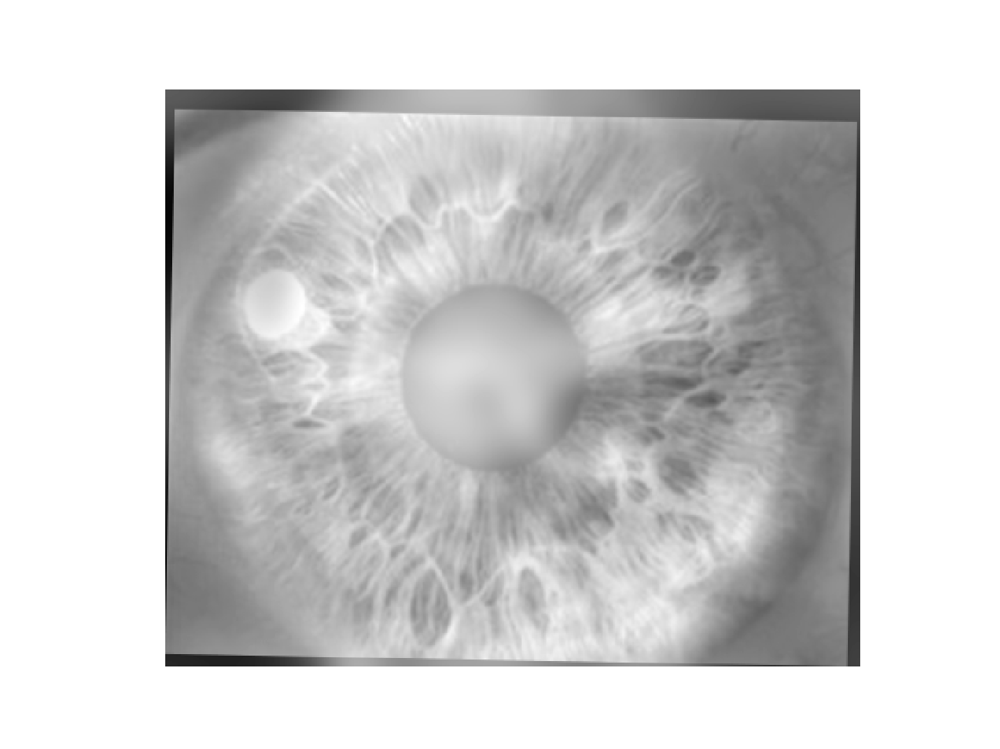

In [27]:
# Optional: Select/ top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }

cropped_object = utils.interactive_crop(im_hybrid)

<IPython.core.display.Javascript object>


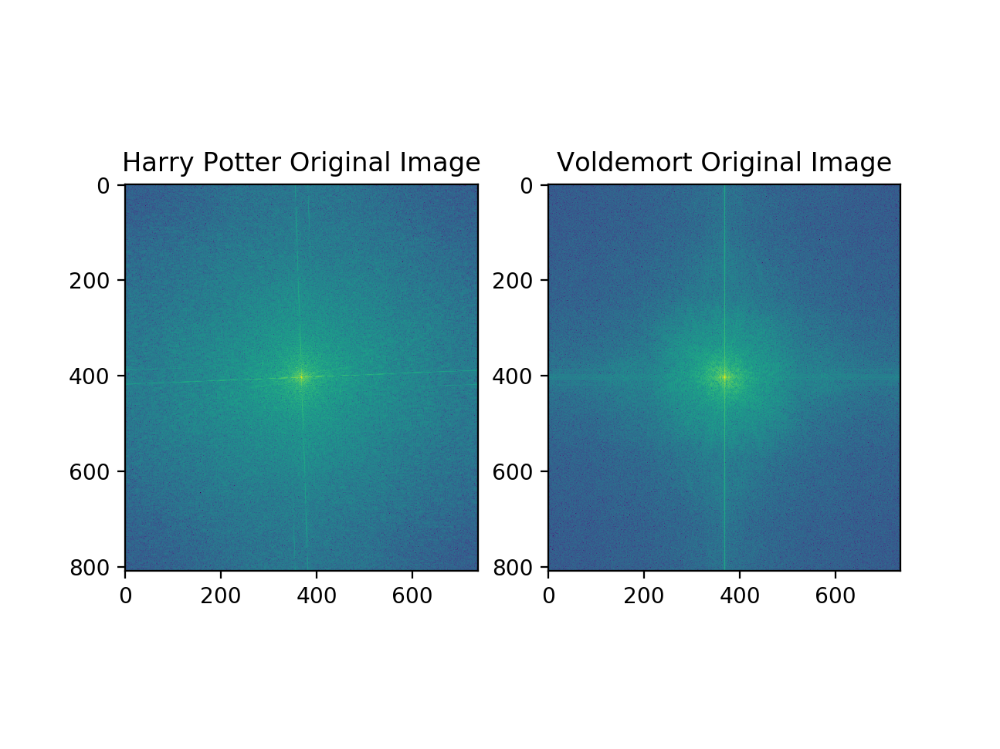

Text(0.5, 1.0, 'Voldemort Original Image')

In [15]:
##fft transform

fig, axes = plt.subplots(1, 2)
axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1)))))
axes[0].set_title('Harry Potter Original Image')
axes[1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2)))))
axes[1].set_title('Voldemort Original Image')




<IPython.core.display.Javascript object>


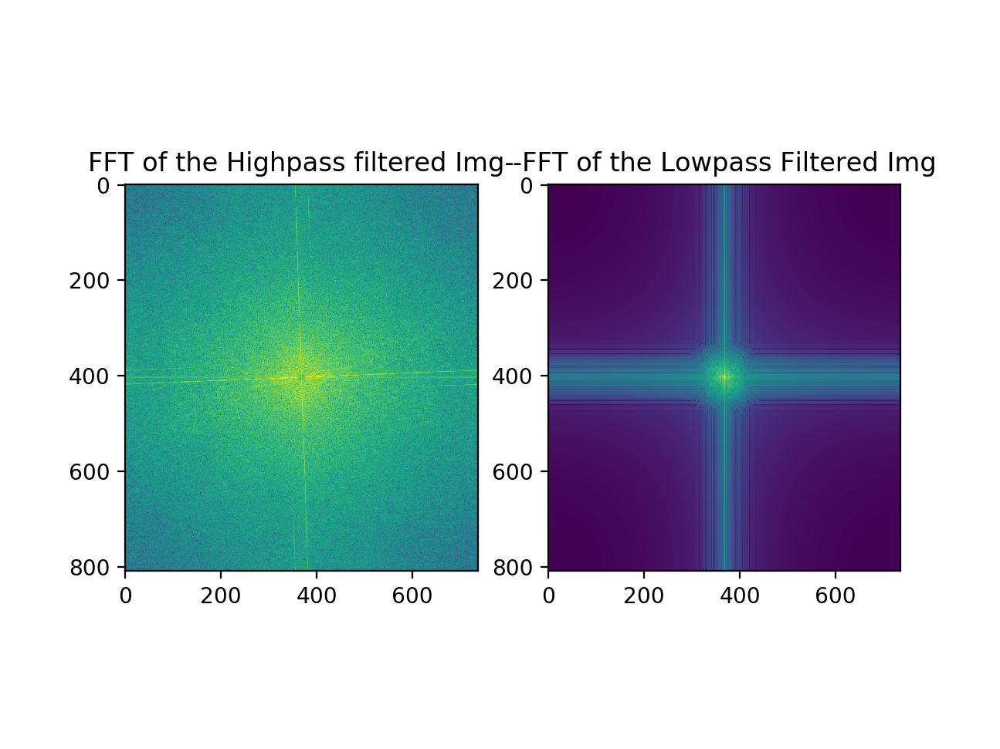

<IPython.core.display.Javascript object>


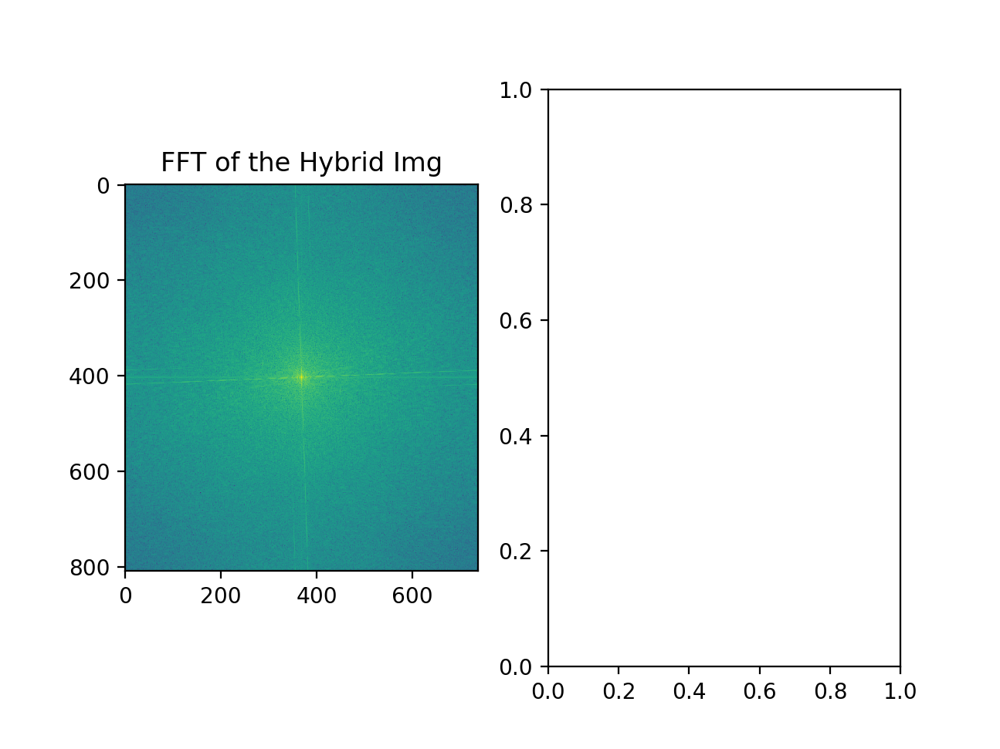

Text(0.5, 1.0, 'FFT of the Hybrid Img')

In [24]:
fig, axes = plt.subplots(1, 2)

axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1_gaussian_filtered)))))
axes[0].set_title('FFT of the Highpass filtered Img-')

axes[1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2_gaussian_filtered)))))
axes[1].set_title('-FFT of the Lowpass Filtered Img')

fig, axes = plt.subplots(1, 2)

axes[0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im_hybrid)))))
axes[0].set_title('FFT of the Hybrid Img')


### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

<IPython.core.display.Javascript object>


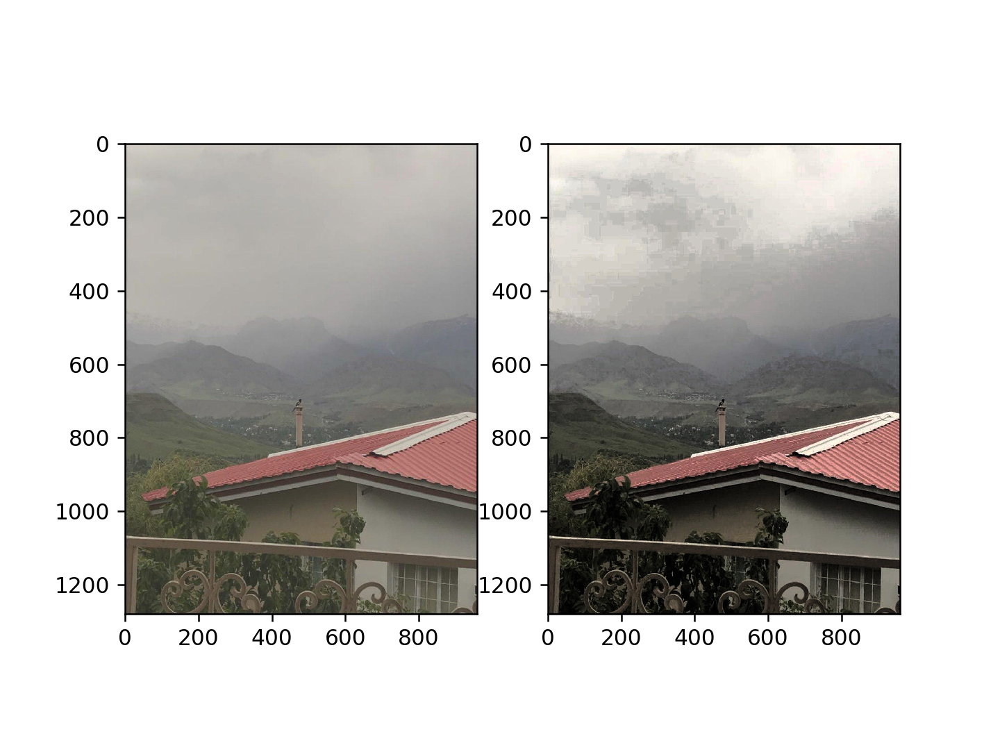

In [44]:
fig, axes = plt.subplots(1,2)
###

im_forEnh_file = "./blury.jpg"
im_forEnh_BGR = cv2.imread(im_forEnh_file)
im_HSV_fromBGR = cv2.cvtColor(im_forEnh_BGR,cv2.COLOR_BGR2HSV)

im_RGB =cv2.cvtColor(im_forEnh_BGR, cv2.COLOR_BGR2RGB)
h , s, v = cv2.split(im_HSV_fromBGR)
v = cv2.equalizeHist(v)

final_hsv = cv2.merge((h, s, v))
final_img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2RGB)



axes[0].imshow(im_RGB)
axes[1].imshow(final_img)

#### Color enhancement 

<IPython.core.display.Javascript object>


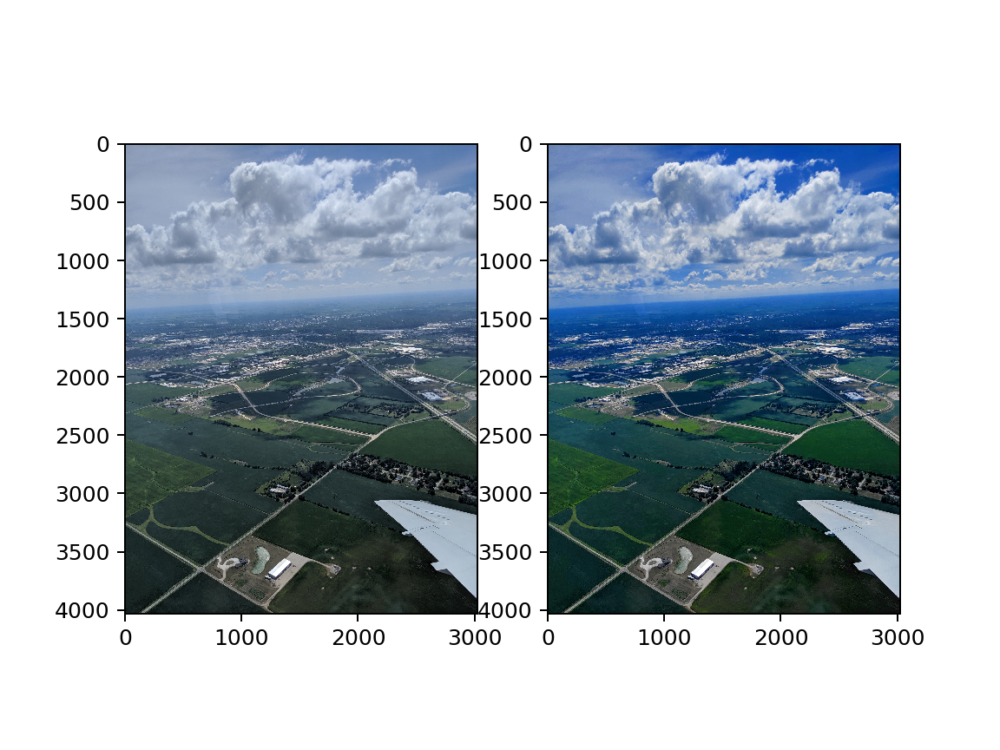

In [16]:
im_forEnh_file = "./airplane.jpg"
im_forEnh_BGR = cv2.imread(im_forEnh_file)
im_HSV_fromBGR = cv2.cvtColor(im_forEnh_BGR,cv2.COLOR_BGR2HSV)

im_RGB =cv2.cvtColor(im_forEnh_BGR, cv2.COLOR_BGR2RGB)
im_HSV_fromRGB = cv2.cvtColor(im_RGB,cv2.COLOR_RGB2HSV)


h , s, v = cv2.split(im_HSV_fromRGB)

s = cv2.equalizeHist(s)

final_hsv = cv2.merge((h, s, v))
final_img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2RGB)

fig, axes = plt.subplots(1, 2)

axes[0].imshow(im_RGB)
axes[1].imshow(final_img)





#### Color shift

<IPython.core.display.Javascript object>


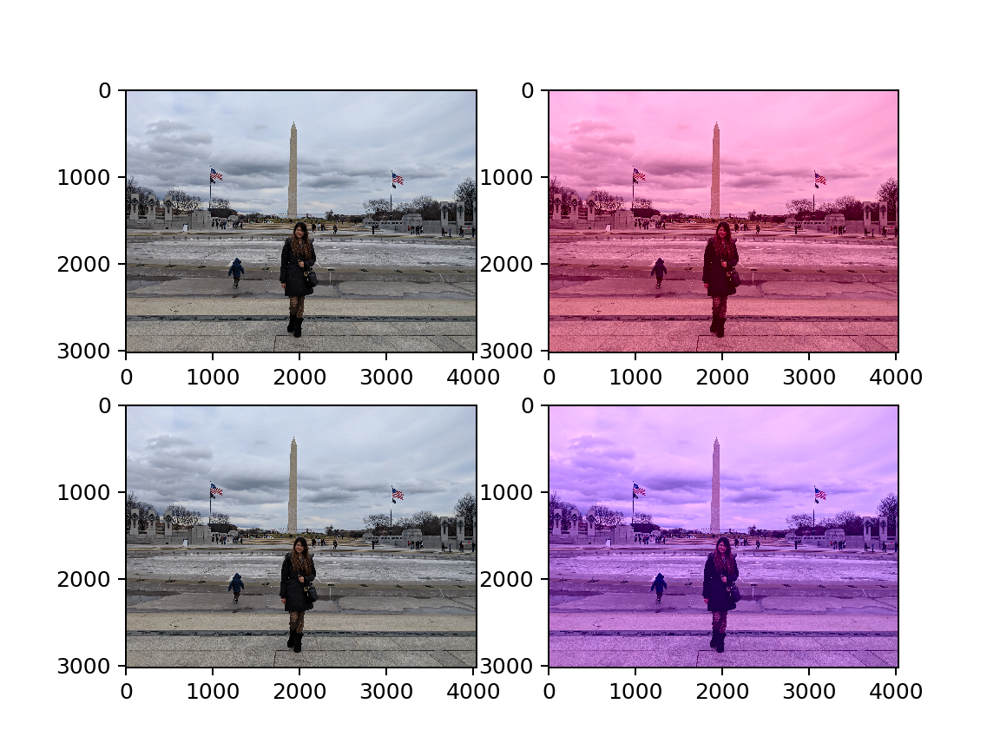

In [28]:
im_forEnh_file = "./DCSogol.jpg"
im_forEnh_BGR = cv2.imread(im_forEnh_file)
im_LAB_fromBGR = cv2.cvtColor(im_forEnh_BGR,cv2.COLOR_BGR2LAB)

im_RGB =cv2.cvtColor(im_forEnh_BGR, cv2.COLOR_BGR2RGB)


l, a, b = cv2.split(im_LAB_fromBGR)

value = 40
a[a >= 255 - value] = 255
a[a < 255 - value ] += value


final_lab = cv2.merge((l,a,b))
final_img = cv2.cvtColor(final_lab, cv2.COLOR_LAB2RGB)

fig, axes = plt.subplots(2,2)
axes[0][0].imshow(im_RGB)
axes[0][1].imshow(final_img)
############################
value = 40


b[b <= value] = 0
b[b > value ] -= value

final_lab = cv2.merge((l,a,b))
final_img = cv2.cvtColor(final_lab, cv2.COLOR_LAB2RGB)

axes[1][0].imshow(im_RGB)
axes[1][1].imshow(final_img)





# np.real(-np.Inf+1)

<IPython.core.display.Javascript object>


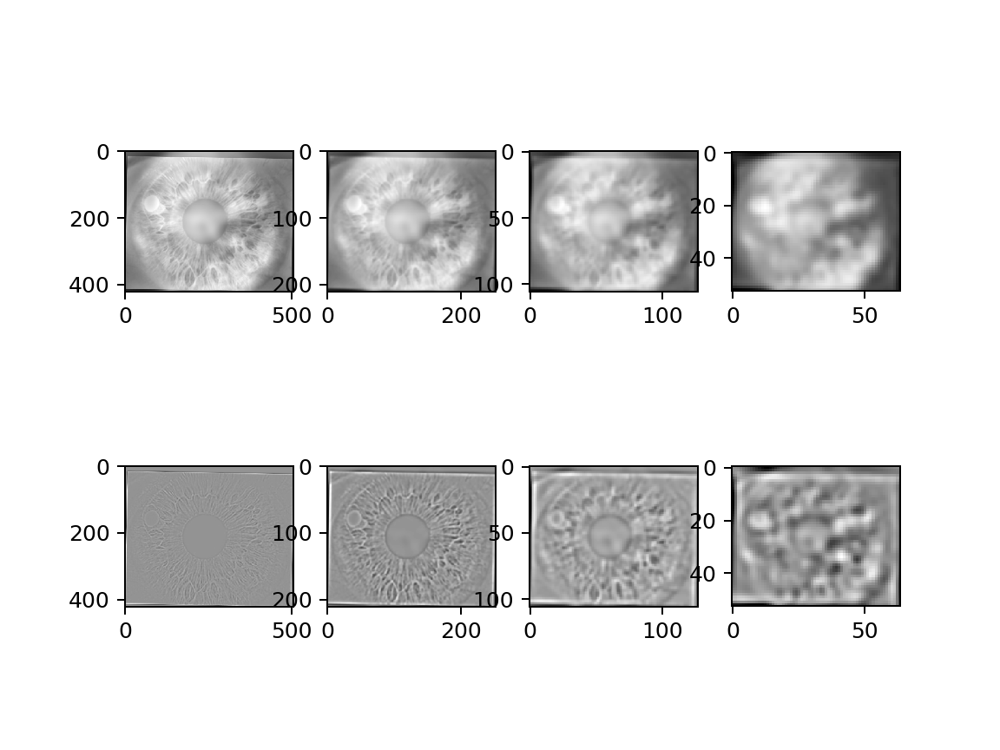

In [29]:
import cv2
import numpy as np,sys
B = cv2.imread('nutmeg.jpg', 0)
A = im_hybrid

cutoff_low = 2
def Gaussian_Pyramid_Down(im2_input):
    gaussian_kernel = utils.gaussian_kernel(cutoff_low,3*cutoff_low )
    im2_gaussian_filtered = signal.convolve2d(im2_input, gaussian_kernel, mode='same',boundary='symm')
    return im2_gaussian_filtered, im2_gaussian_filtered[::2, ::2]


G = A.copy()
gpA = [G]
smoothed = []
original = [G]
for i in range(4):
    smooth, downsampled = Gaussian_Pyramid_Down(G)
    smoothed.append(smooth)
    original.append(downsampled)
    G = downsampled
lpA = []
for i in range(0, len(smoothed)):
    lpA.append(original[i] - smoothed[i])
    
fig, axes = plt.subplots(2, 4)
for i in range(0,4):
    axes[0][i].imshow(original[i], cmap= 'gray')
    axes[1][i].imshow(lpA[i],cmap='gray')



(1088, 951, 3) (842, 691)


<IPython.core.display.Javascript object>


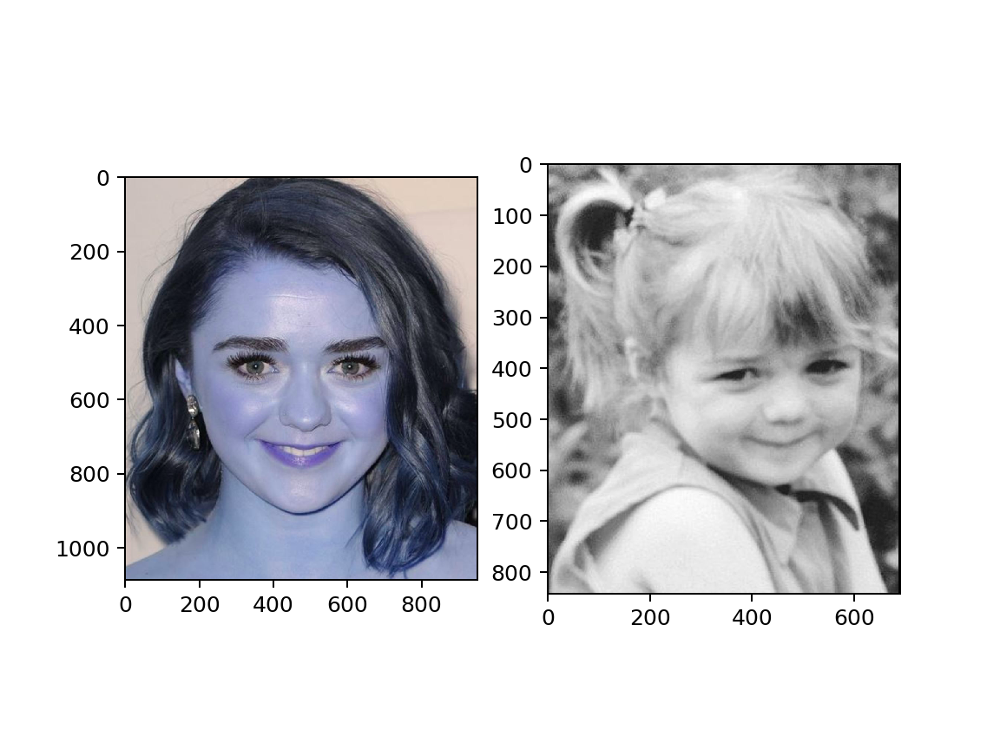

In [30]:
missienow_colored = cv2.imread("missieNow.jpg")
missiethen_grayscale = cv2.imread("missieThen.jpg", cv2.IMREAD_GRAYSCALE)
print(missienow_colored.shape, missiethen_grayscale.shape)
fig, axes = plt.subplots(1,2)

axes[0].imshow(missienow_colored)
axes[1].imshow(missiethen_grayscale, cmap='gray')

<IPython.core.display.Javascript object>


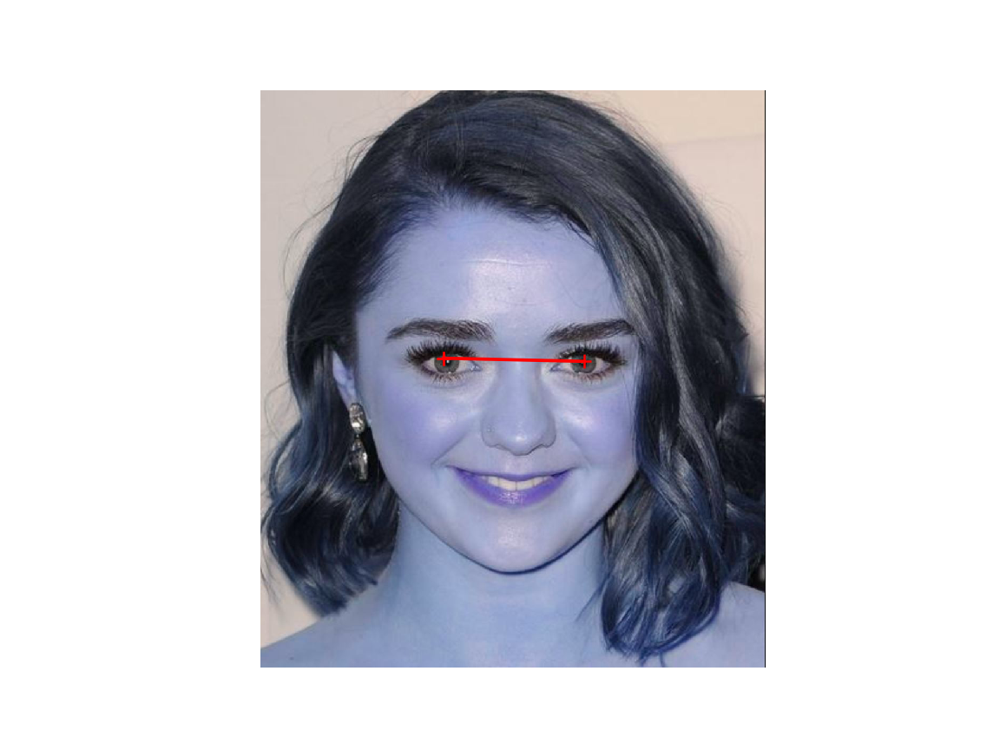

In [31]:
pts_missie_colored = utils.prompt_eye_selection(missienow_colored)

<IPython.core.display.Javascript object>


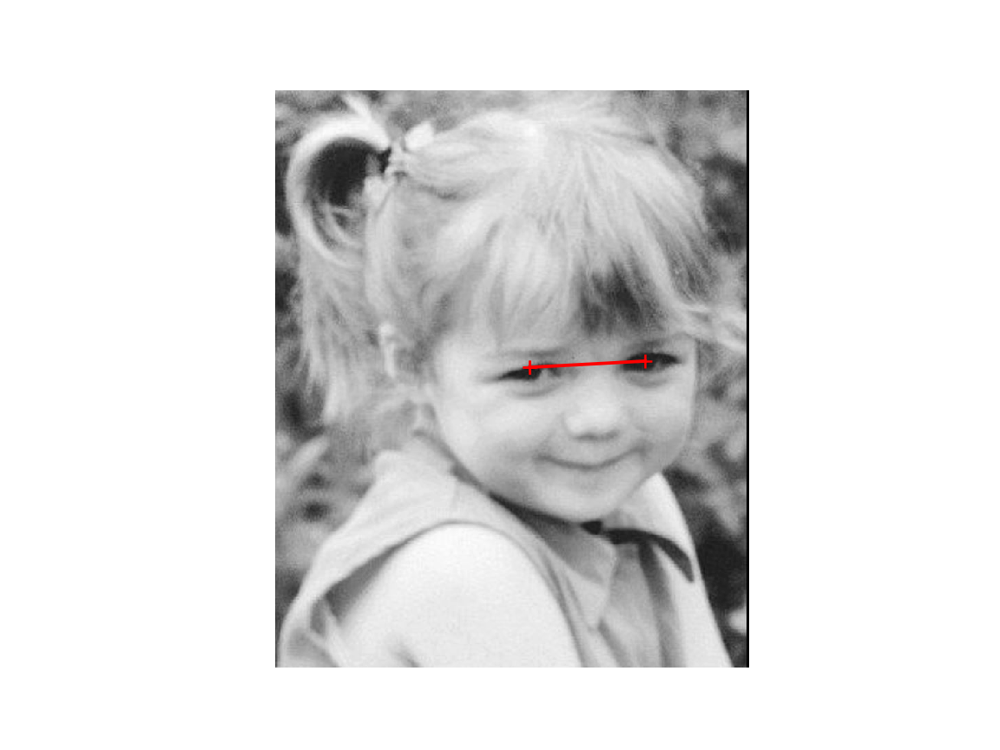

In [32]:
pts_missie_gray = utils.prompt_eye_selection(missiethen_grayscale)

In [33]:
alligned_missie_now, alligned_missie_then = utils.align_images("missieNow.jpg", "missieThen.jpg",pts_missie_colored,pts_missie_gray,save_images=False)

<IPython.core.display.Javascript object>


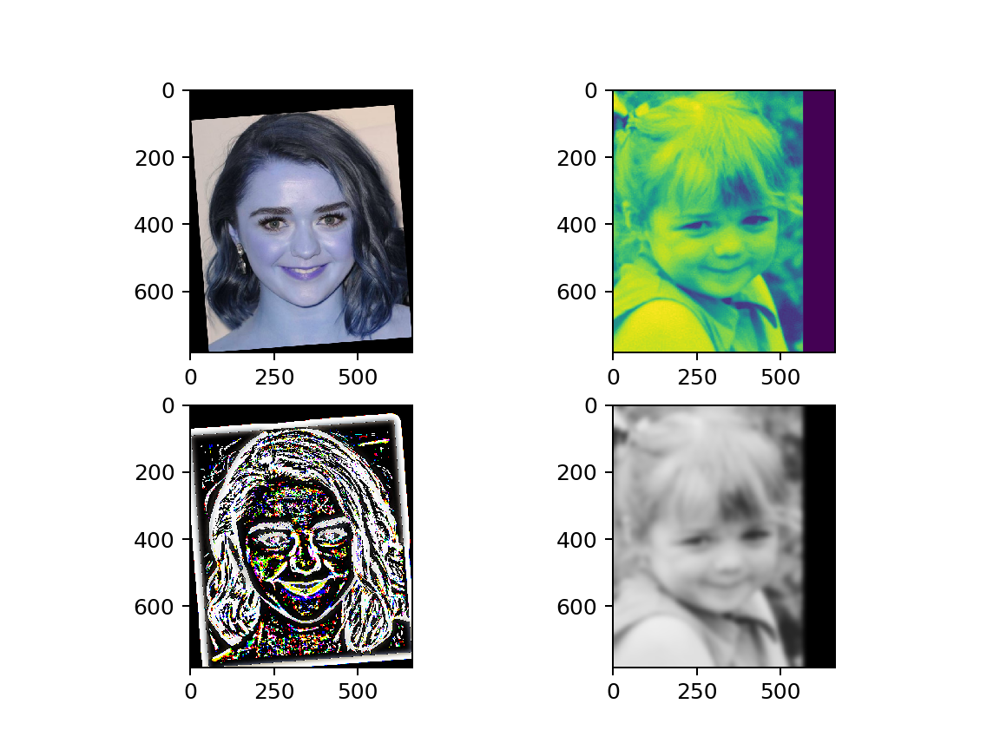

(783, 663) (783, 663, 3)
(783, 663)


In [34]:
fig, axes = plt.subplots(2,2)
alligned_missie_then = cv2.cvtColor(alligned_missie_then, cv2.COLOR_BGR2GRAY) 
print(alligned_missie_then.shape, alligned_missie_now.shape)

gaussian_kernel = utils.gaussian_kernel(7, 21 )

missiethen_G_filtered = cv2.filter2D(alligned_missie_then, cv2.CV_64F, gaussian_kernel)
missiethen_G_normalized =  missiethen_G_filtered.astype(np.uint8) 
print(missiethen_G_normalized.shape)


(3024, 4032)
-1.1368683772161603e-13 238.53839615632376


<IPython.core.display.Javascript object>


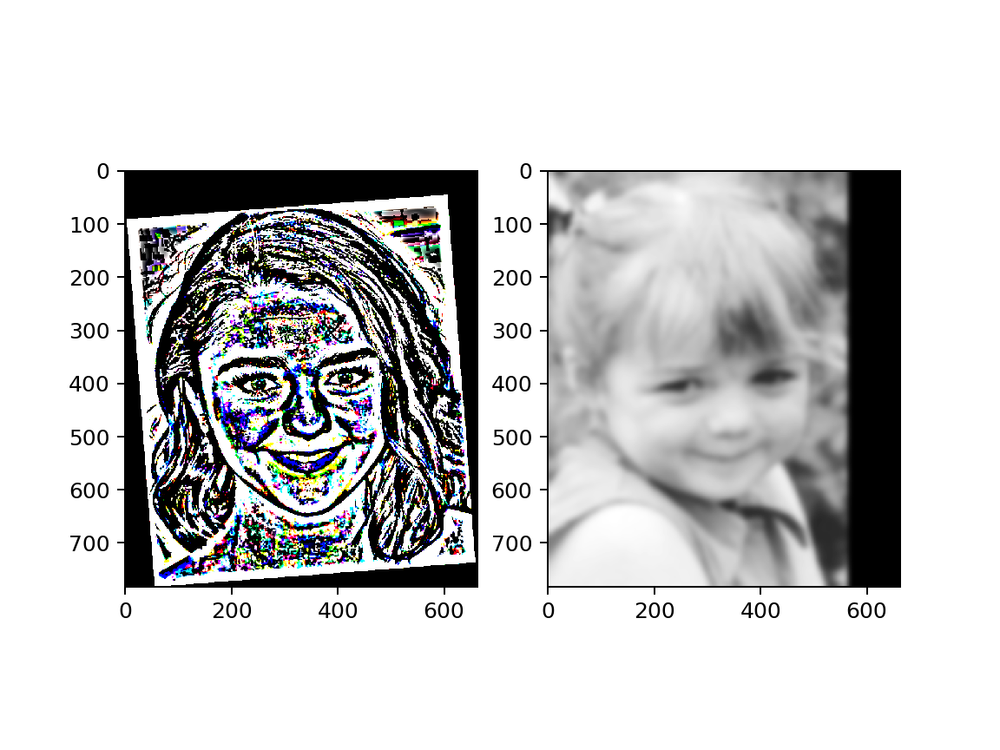

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2 (783, 663, 3)
2 (783, 663, 3)
-159.92447491407873 166.67044210511412
0 255 (783, 663, 3)


In [35]:

M_then_norm_gray = cv2.cvtColor(missiethen_G_normalized, cv2.COLOR_GRAY2BGR) 
print(b.shape)
axes[0][0].imshow(alligned_missie_now)
axes[0][1].imshow(alligned_missie_then)
axes[1][1].imshow(M_then_norm_gray, cmap='gray')


u, i = hybridImage(alligned_missie_now, alligned_missie_then, 5, 8)
print(u.min(), u.max())
u = u.astype(np.uint8) 
print(u.min(), u.max(), u.shape)


axes[1][0].imshow(u )


<IPython.core.display.Javascript object>


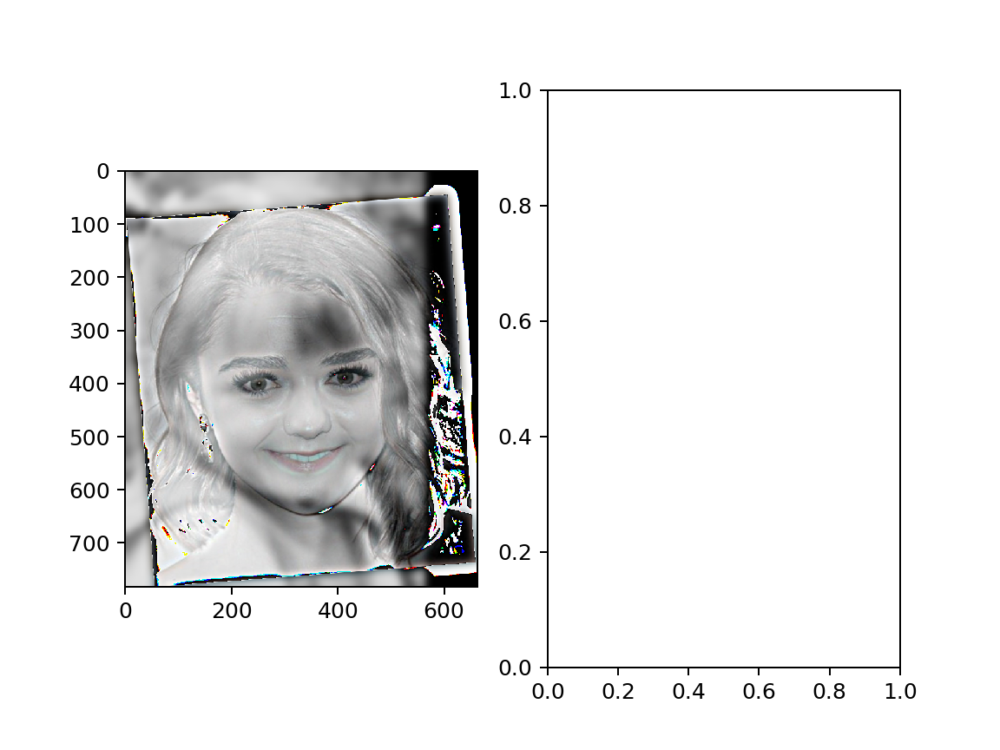

0 255
0 238


In [41]:
fig, axes = plt.subplots(1,2)
# u, i = hybridImage(im11, im44, 1, 7)
print(u.min(), u.max())
# u = u.astype(np.uint8) 
print(M_then_norm_gray.min(), M_then_norm_gray.max())
x = u + M_then_norm_gray
x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB) 
axes[0].imshow(x)
